First 20 records:
    Unnamed: 0  seq    open    high     low   close  volume  tick_volume  \
0          249  249  5949.5  5950.0  5949.0  5950.0    60.0         12.0   
1          250  250  5950.5  5950.5  5950.5  5950.5    10.0          2.0   
2          251  251  5949.5  5949.5  5949.0  5949.0    25.0          5.0   
3          252  252  5948.5  5948.5  5948.5  5948.5    10.0          2.0   
4          253  253  5947.5  5948.0  5947.0  5947.5    55.0         11.0   
5          254  254  5950.0  5950.5  5949.5  5950.5   140.0         15.0   
6          255  255  5951.0  5951.0  5950.5  5951.0    45.0          9.0   
7          256  256  5949.5  5950.0  5949.5  5950.0    30.0          6.0   
8          257  257  5950.5  5951.0  5950.5  5951.0    70.0         10.0   
9          258  258  5952.0  5952.0  5952.0  5952.0    25.0          5.0   
10         259  259  5953.0  5953.5  5953.0  5953.5    35.0          7.0   
11         260  260  5954.0  5954.0  5954.0  5954.0     5.0          1

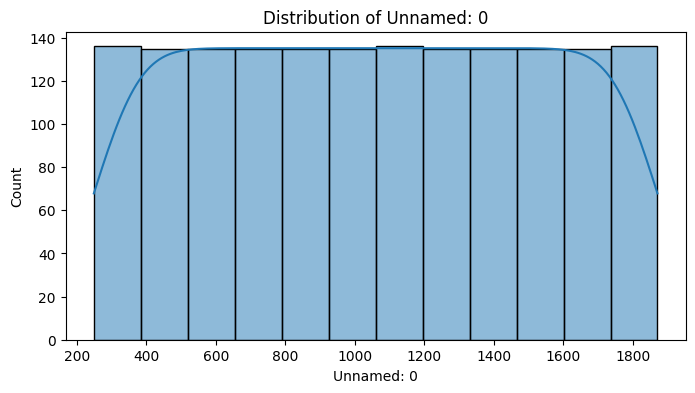

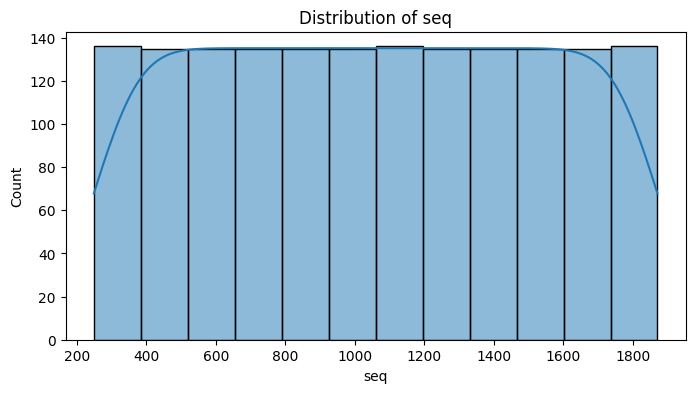

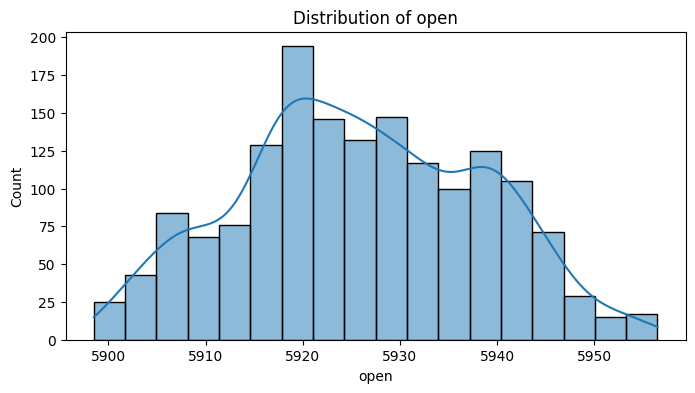

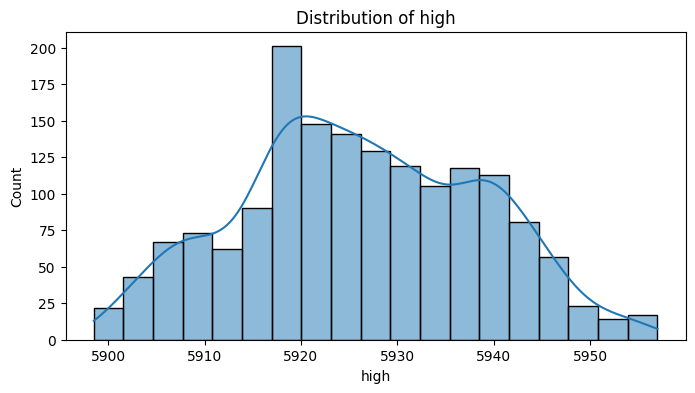

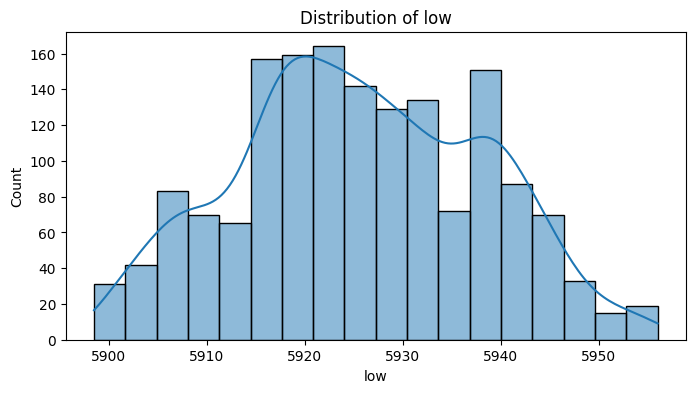

...

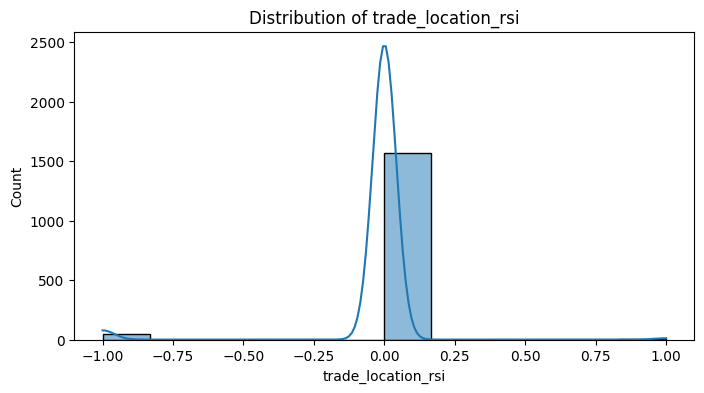

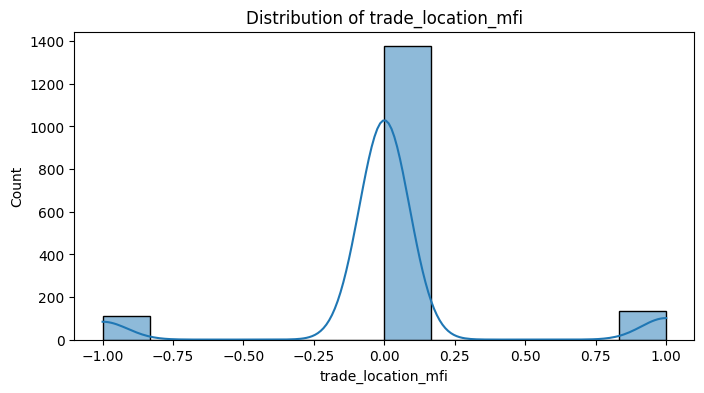

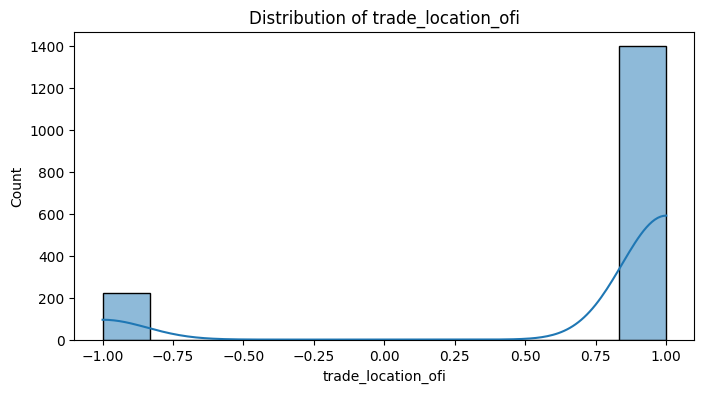

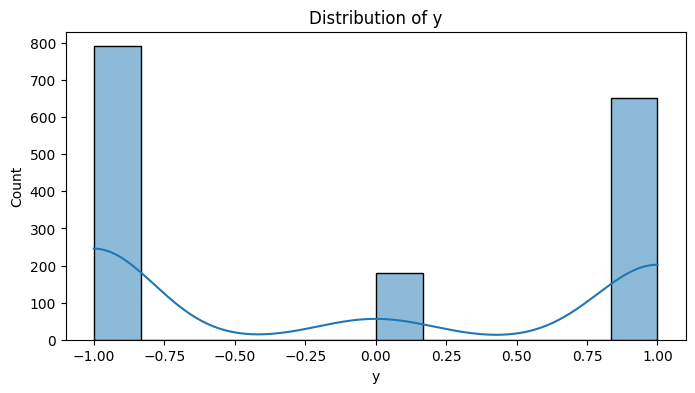

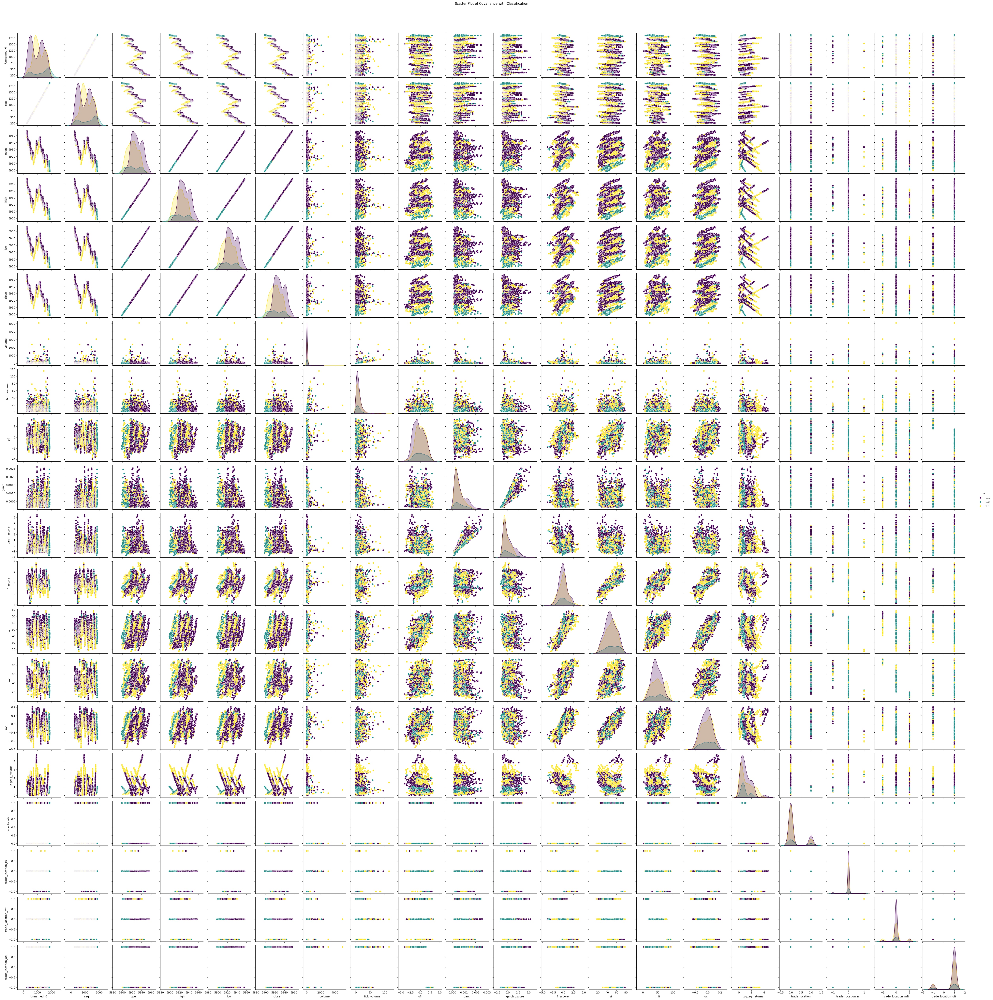

KeyError: 'field1'

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the CSV file
file_path = 'df_train_ofi.csv'  # Replace with your file path
data = pd.read_csv(file_path)

# a) Print the first 20 records
print("First 20 records:")
print(data.head(20))

# b) List all fields and the type of each one
print("\nFields and their types:")
print(data.dtypes)

# c) Array to list which fields must be normalized
fields_to_normalize = ['field1', 'field2']  # Replace with actual fields

# d) Array to list which fields must be standardized
fields_to_standardize = ['field3', 'field4']  # Replace with actual fields

# e) Print statistics
print("\nStatistics:")
print(f"Number of records: {len(data)}")
print(f"Number of blank records: {data.isnull().sum().sum()}")
for column in data.select_dtypes(include=[np.number]).columns:
    print(f"\nStatistics for {column}:")
    print(f"Min: {data[column].min()}")
    print(f"Max: {data[column].max()}")
    print(f"Mean: {data[column].mean()}")
    print(f"Mode: {data[column].mode()[0]}")
    print(f"Standard Deviation: {data[column].std()}")

# f) Print graphs of distribution of each field
for column in data.columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[column].dropna(), kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()

# g) Scatter plot of covariance of each pair of numeric fields
numeric_data = data.select_dtypes(include=[np.number])

# Check if there is a column named 'Y' or 'y'
label_column = None
if 'Y' in data.columns:
    label_column = 'Y'
elif 'y' in data.columns:
    label_column = 'y'

# Plot scatter plots with classification if 'Y' or 'y' exists
if label_column:
    sns.pairplot(numeric_data, hue=label_column, palette='viridis')
else:
    sns.pairplot(numeric_data)
plt.suptitle('Scatter Plot of Covariance with Classification' if label_column else 'Scatter Plot of Covariance', y=1.02)
plt.show()

# h) Normalize and standardize data, then save to new CSV files
data_normalized = data.copy()
data_standardized = data.copy()

for field in fields_to_normalize:
    data_normalized[field] = (data_normalized[field] - data_normalized[field].min()) / (data_normalized[field].max() - data_normalized[field].min())

for field in fields_to_standardize:
    data_standardized[field] = (data_standardized[field] - data_standardized[field].mean()) / data_standardized[field].std()

data_normalized.to_csv(file_path.replace('.csv', '-normalized.csv'), index=False)
data_standardized.to_csv(file_path.replace('.csv', '-standardized.csv'), index=False)